### IMPORT LIBRARY AND IMPORTANT VARIABLES

In [1]:
import os
import shutil
import random
import hashlib
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
import seaborn as sns
from PIL import Image
import cv2

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

import warnings
warnings.filterwarnings("ignore", 
                        category = FutureWarning)

print("Libraries imported successfully.")
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

Libraries imported successfully.
Num GPUs Available: 1


In [2]:
DATA_PATH = "./archive"
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
BATCH_SIZE = 4
EPOCHS = 100

### READ IMAGES

In [3]:
def load_data(metadata_path, test_size = 0.2):
    df = pd.read_csv(metadata_path)
    image_paths = [os.path.normpath(os.path.join(DATA_PATH, "Image", fname)) for fname in df["Image"]]
    mask_paths  = [os.path.normpath(os.path.join(DATA_PATH, "Mask", fname)) for fname in df["Mask"]]

    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(
        image_paths, 
        mask_paths, 
        test_size = test_size, 
        random_state = SEED
    )
    return (train_img_paths, train_mask_paths), (val_img_paths, val_mask_paths)

In [4]:
def read_image(path):
    path = os.path.normpath(path)
    if not os.path.exists(path):
        print(f"[ERROR] Image path does not exist: {path}")
        return np.zeros((IMG_HEIGHT, IMG_WIDTH, 3), 
                        dtype = np.float32)
    img = cv2.imread(path)
    if img is None:
        print(f"[ERROR] Failed to load image: {path}")
        return np.zeros((IMG_HEIGHT, IMG_WIDTH, 3), 
                        dtype = np.float32)
    img = cv2.cvtColor(img, 
                       cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, 
                     (IMG_WIDTH, IMG_HEIGHT))
    img = img / 255.0
    return img

In [5]:
def read_mask(path):
    path = os.path.normpath(path)
    if not os.path.exists(path):
        print(f"[ERROR] Mask path does not exist: {path}")
        return np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), 
                        dtype = np.float32)
    mask = cv2.imread(path, 
                      cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f"[ERROR] Failed to load mask: {path}")
        return np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), 
                        dtype = np.float32)
    
    mask = cv2.resize(mask, 
                      (IMG_WIDTH, IMG_HEIGHT))
    mask = np.expand_dims(mask, 
                          axis = -1)
    mask = mask / 255.0
    return mask

In [6]:
(train_images, train_masks), (val_images, val_masks) = load_data(os.path.join(DATA_PATH, "metadata.csv"))
print(f"Training samples: {len(train_images)}, Validation samples: {len(val_images)}")

Training samples: 232, Validation samples: 58


> Based on the output above, it's known that the data  has been successfully read, with a total of 232 training samples and 58 validation samples.

### EXPLORATORY DATA ANALYSIS

#### VIEW RANDOM IMAGE

In [7]:
def view_random_image(file_list, n):
    n = min(n, len(file_list))
    random_image = random.sample(file_list, n)
    cols = min(n, 5)
    rows = (n + cols - 1) // cols
    plt.figure(figsize = (4 * cols, 4 * rows))
    for i in range(0, n): 
        plt.subplot(rows, cols, i+1)
        img = mpimg.imread(random_image[i])
        plt.imshow(img)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

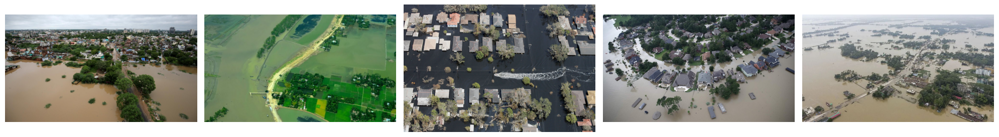

In [8]:
view_random_image(train_images, 5)

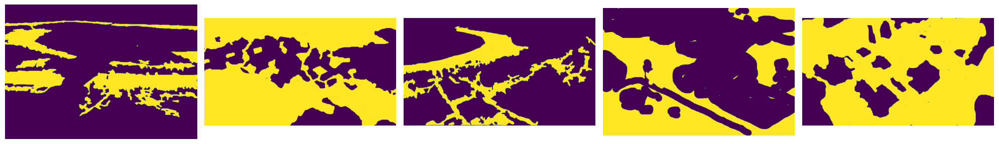

In [9]:
view_random_image(train_masks, 5)

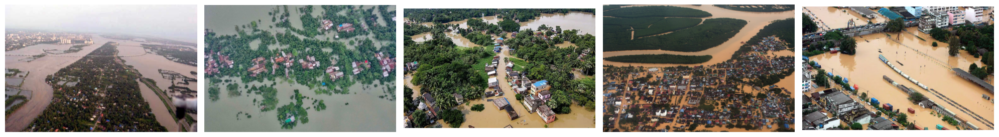

In [10]:
view_random_image(val_images, 5)

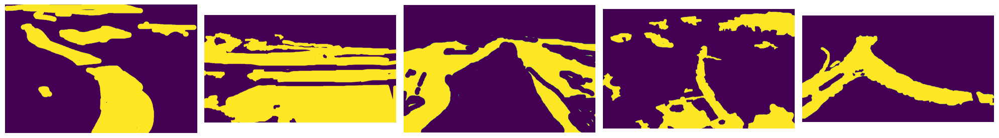

In [11]:
view_random_image(val_masks, 5)

> Based on the output above, the data has been successfully read.

#### CHECK CORRUPTED IMAGE

In [12]:
def check_corrupted(file_list):
    corrupted = []
    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                img.verify()
        except Exception as e:
            print(f"Corrupted: {norm_path} ({e})")
            corrupted.append(norm_path)

    print(f"Total corrupted images found: {len(corrupted)}")
    return corrupted

In [13]:
check_corrupted(train_images)

Total corrupted images found: 0


[]

In [14]:
check_corrupted(train_masks)

Total corrupted images found: 0


[]

In [15]:
check_corrupted(val_images)

Total corrupted images found: 0


[]

In [16]:
check_corrupted(val_masks)

Total corrupted images found: 0


[]

> Based on the output above, the data has no corrupted images, so the exploration can continue.

#### CHECK DUPLICATED IMAGE

In [17]:
def check_duplicated(file_list):
    hashes = {}
    duplicated = []

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with open(norm_path, "rb") as f:
                file_hash = hashlib.md5(f.read()).hexdigest()
            if file_hash in hashes:
                duplicated.append((norm_path, hashes[file_hash]))
            else:
                hashes[file_hash] = norm_path
        except Exception as e:
            print(f"Error reading {norm_path}: {e}")

    print(f"Total duplicates found: {len(duplicated)}")
    return duplicated

In [18]:
def view_duplicated(duplicated_image):
    all_paths = []
    labels = []
    for dup, ori in duplicated_image:
        all_paths.append(os.path.normpath(ori))
        labels.append("Original")
        all_paths.append(os.path.normpath(dup))
        labels.append("Duplicate")

    total = len(all_paths)
    cols = 2
    rows = len(duplicated_image)

    plt.figure(figsize = (10, 4 * rows))
    for i, (path, label) in enumerate(zip(all_paths, labels)):
        plt.subplot(rows, cols, i + 1)
        img = mpimg.imread(path)
        plt.imshow(img)
        plt.title(f"{label}\n{path}",
                  fontsize = 9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [19]:
check_duplicated(train_images)

Total duplicates found: 6


[('archive\\Image\\1049.jpg', 'archive\\Image\\3019.jpg'),
 ('archive\\Image\\3020.jpg', 'archive\\Image\\26.jpg'),
 ('archive\\Image\\43.jpg', 'archive\\Image\\1021.jpg'),
 ('archive\\Image\\1041.jpg', 'archive\\Image\\3033.jpg'),
 ('archive\\Image\\1033.jpg', 'archive\\Image\\3029.jpg'),
 ('archive\\Image\\1012.jpg', 'archive\\Image\\1057.jpg')]

In [20]:
check_duplicated(train_masks)

Total duplicates found: 3


[('archive\\Mask\\1038.png', 'archive\\Mask\\1079.png'),
 ('archive\\Mask\\1032.png', 'archive\\Mask\\1061.png'),
 ('archive\\Mask\\3059.png', 'archive\\Mask\\3034.png')]

In [21]:
check_duplicated(val_images)

Total duplicates found: 0


[]

In [22]:
check_duplicated(val_masks)

Total duplicates found: 0


[]

Total duplicates found: 6


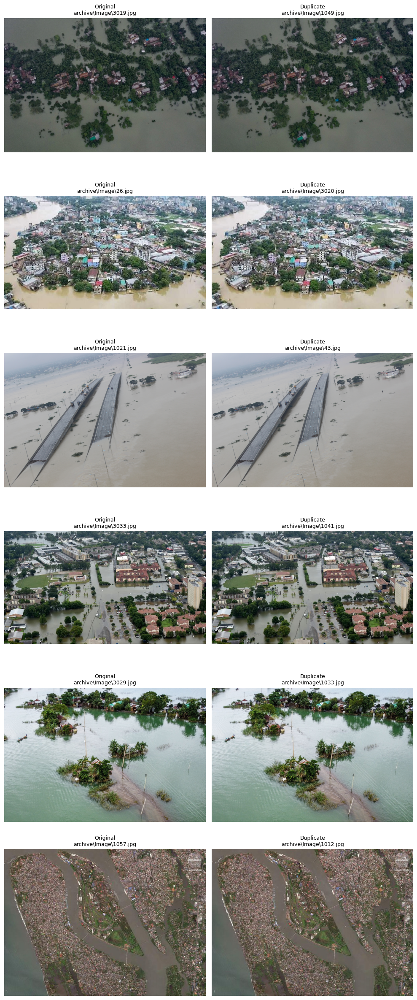

In [23]:
view_duplicated(check_duplicated(train_images))

Total duplicates found: 3


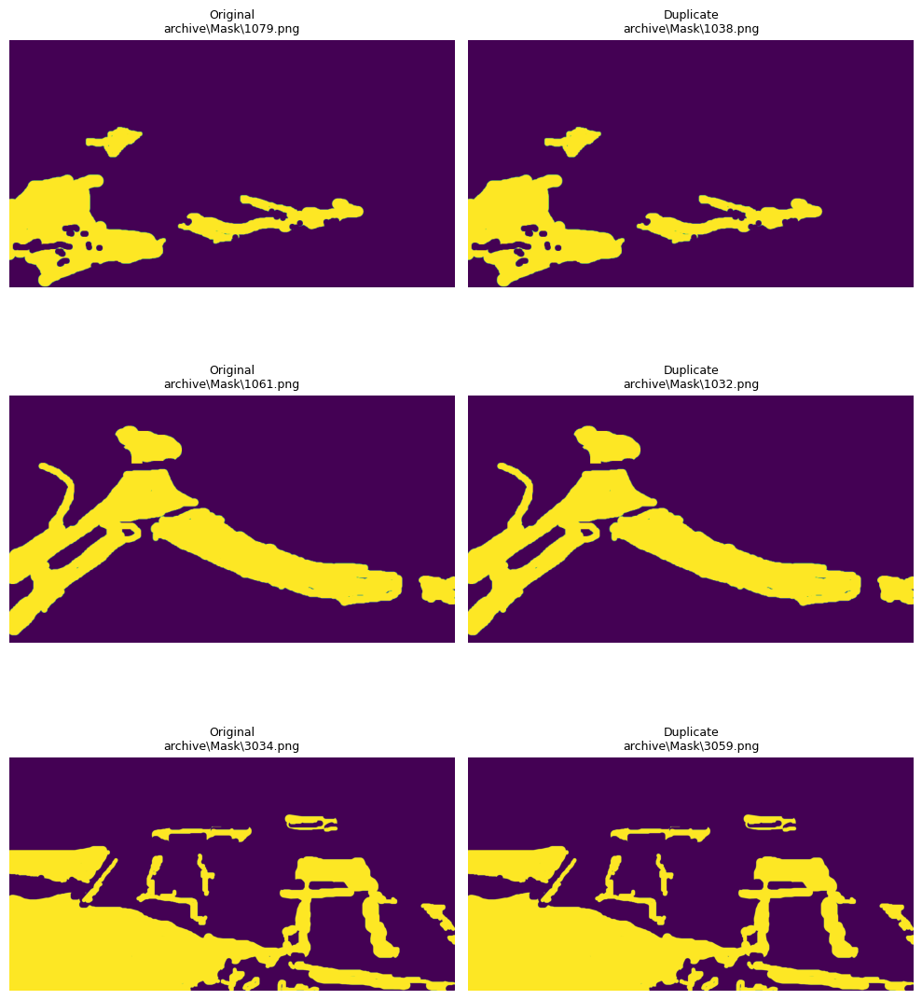

In [24]:
view_duplicated(check_duplicated(train_masks))

In [25]:
view_duplicated(check_duplicated(val_images))

Total duplicates found: 0


<Figure size 1000x0 with 0 Axes>

In [26]:
view_duplicated(check_duplicated(val_masks))

Total duplicates found: 0


<Figure size 1000x0 with 0 Axes>

> Based on the duplicate check, the analysis shows there are 6 duplicate pairs in the training images and 3 duplicate pairs in the training masks.

#### CHECK IMAGE RESOLUTIONS

In [27]:
def check_resolution(file_list):
    resolution_map = {}
    counter = {}

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                res = img.size

                if res not in resolution_map:
                    resolution_map[res] = []
                resolution_map[res].append(norm_path)

                if res in counter:
                    counter[res] += 1
                else:
                    counter[res] = 1
        except Exception as e:
            print(f"Failed to read {norm_path}: {e}")

    print(f"Total images checked: {sum(counter.values())}")
    print(f"Unique resolutions found: {len(counter)}")

    print("List of unique resolutions:")
    for res in sorted(counter.keys()):
        print(f" - {res[0]}x{res[1]} ({counter[res]} images)")

In [28]:
check_resolution(train_images)

Total images checked: 232
Unique resolutions found: 165
List of unique resolutions:
 - 330x244 (1 images)
 - 340x221 (1 images)
 - 357x300 (1 images)
 - 380x285 (1 images)
 - 400x225 (1 images)
 - 400x240 (1 images)
 - 400x400 (1 images)
 - 402x328 (1 images)
 - 408x230 (1 images)
 - 408x272 (1 images)
 - 435x290 (1 images)
 - 450x250 (1 images)
 - 450x253 (1 images)
 - 450x338 (1 images)
 - 480x270 (2 images)
 - 500x300 (1 images)
 - 510x259 (1 images)
 - 512x341 (1 images)
 - 553x311 (1 images)
 - 590x332 (2 images)
 - 590x350 (1 images)
 - 600x314 (1 images)
 - 600x337 (3 images)
 - 600x338 (3 images)
 - 600x400 (2 images)
 - 600x442 (1 images)
 - 600x450 (3 images)
 - 600x469 (1 images)
 - 604x440 (2 images)
 - 612x344 (1 images)
 - 612x408 (4 images)
 - 612x459 (2 images)
 - 620x400 (2 images)
 - 620x464 (1 images)
 - 626x351 (1 images)
 - 626x417 (1 images)
 - 626x470 (1 images)
 - 630x354 (1 images)
 - 630x355 (1 images)
 - 630x418 (1 images)
 - 640x366 (1 images)
 - 640x381 (1 

In [29]:
check_resolution(train_masks)

Total images checked: 232
Unique resolutions found: 164
List of unique resolutions:
 - 330x244 (1 images)
 - 340x221 (1 images)
 - 357x300 (1 images)
 - 380x285 (1 images)
 - 400x225 (1 images)
 - 400x240 (1 images)
 - 400x400 (1 images)
 - 402x328 (1 images)
 - 408x230 (1 images)
 - 408x272 (1 images)
 - 435x290 (1 images)
 - 450x250 (1 images)
 - 450x253 (1 images)
 - 450x338 (1 images)
 - 480x270 (2 images)
 - 500x300 (1 images)
 - 510x259 (1 images)
 - 512x341 (1 images)
 - 553x311 (1 images)
 - 590x332 (2 images)
 - 590x350 (1 images)
 - 600x314 (1 images)
 - 600x337 (3 images)
 - 600x338 (3 images)
 - 600x400 (2 images)
 - 600x442 (1 images)
 - 600x450 (3 images)
 - 600x469 (1 images)
 - 604x440 (2 images)
 - 612x344 (1 images)
 - 612x408 (4 images)
 - 612x459 (2 images)
 - 620x400 (2 images)
 - 620x464 (1 images)
 - 626x351 (1 images)
 - 626x417 (1 images)
 - 626x470 (1 images)
 - 630x354 (1 images)
 - 630x355 (1 images)
 - 630x418 (1 images)
 - 640x366 (1 images)
 - 640x381 (1 

In [30]:
check_resolution(val_images)

Total images checked: 58
Unique resolutions found: 52
List of unique resolutions:
 - 374x510 (1 images)
 - 400x300 (1 images)
 - 408x230 (1 images)
 - 480x360 (1 images)
 - 587x390 (1 images)
 - 590x332 (1 images)
 - 595x350 (1 images)
 - 600x312 (1 images)
 - 600x400 (1 images)
 - 610x407 (1 images)
 - 620x402 (1 images)
 - 620x464 (2 images)
 - 621x414 (2 images)
 - 626x352 (1 images)
 - 628x378 (1 images)
 - 634x950 (1 images)
 - 660x372 (1 images)
 - 718x404 (1 images)
 - 750x422 (1 images)
 - 754x410 (1 images)
 - 759x422 (1 images)
 - 760x443 (1 images)
 - 768x432 (1 images)
 - 782x434 (1 images)
 - 800x449 (1 images)
 - 800x532 (1 images)
 - 862x575 (1 images)
 - 960x540 (1 images)
 - 976x650 (1 images)
 - 1000x565 (1 images)
 - 1000x666 (1 images)
 - 1012x490 (1 images)
 - 1020x671 (1 images)
 - 1024x462 (1 images)
 - 1024x607 (1 images)
 - 1024x682 (1 images)
 - 1080x716 (1 images)
 - 1198x673 (1 images)
 - 1200x675 (1 images)
 - 1200x749 (1 images)
 - 1200x800 (4 images)
 - 1

In [31]:
check_resolution(val_masks)

Total images checked: 58
Unique resolutions found: 51
List of unique resolutions:
 - 374x510 (1 images)
 - 400x300 (1 images)
 - 408x230 (1 images)
 - 480x360 (1 images)
 - 587x390 (1 images)
 - 590x332 (1 images)
 - 595x350 (1 images)
 - 600x312 (1 images)
 - 600x400 (1 images)
 - 610x407 (1 images)
 - 620x402 (1 images)
 - 620x464 (2 images)
 - 621x414 (2 images)
 - 626x352 (1 images)
 - 628x378 (1 images)
 - 634x950 (1 images)
 - 660x372 (1 images)
 - 718x404 (1 images)
 - 750x422 (1 images)
 - 754x410 (1 images)
 - 759x422 (1 images)
 - 760x443 (1 images)
 - 768x432 (1 images)
 - 782x434 (1 images)
 - 800x449 (1 images)
 - 800x532 (1 images)
 - 862x575 (1 images)
 - 960x540 (1 images)
 - 976x650 (1 images)
 - 1000x565 (1 images)
 - 1000x666 (1 images)
 - 1020x671 (1 images)
 - 1024x462 (1 images)
 - 1024x607 (1 images)
 - 1024x682 (1 images)
 - 1080x716 (1 images)
 - 1198x673 (1 images)
 - 1200x675 (1 images)
 - 1200x749 (1 images)
 - 1200x800 (5 images)
 - 1232x821 (2 images)
 - 1

> The analysis shows that image and mask dimensions are highly variable across the entire dataset.
> - Training Set: Out of 232 files, there are 165 unique resolutions for images and 164 for masks.
> - Validation Set: Out of 58 files, there are 52 unique resolutions for images and 51 for masks.

#### CHECK UNIQUE ASPECT RATIO

In [32]:
def check_aspect_ratio(file_list, show_plot = True):
    aspect_ratios = []

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                w, h = img.size
                if h != 0:
                    aspect_ratios.append(w / h)
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")

    if show_plot:
        plt.figure(figsize = (8, 4))
        plt.hist(aspect_ratios, bins = 30, color = "#097969", edgecolor = "black")
        plt.title("Aspect Ratio Distribution")
        plt.xlabel("Aspect Ratio (Width / Height)")
        plt.ylabel("Image Count")
        plt.tight_layout()
        plt.show()

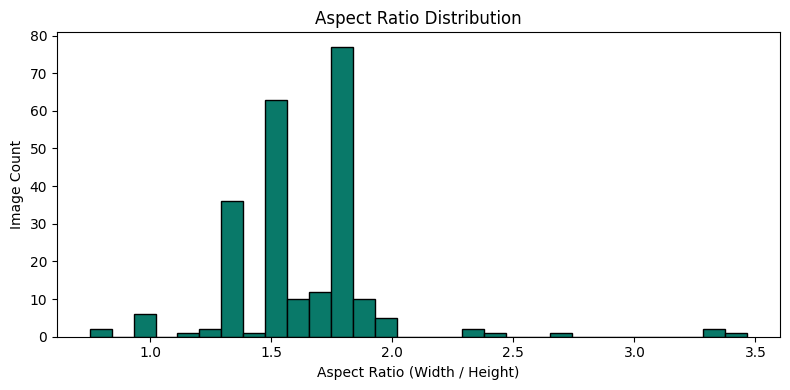

In [33]:
check_aspect_ratio(train_images)

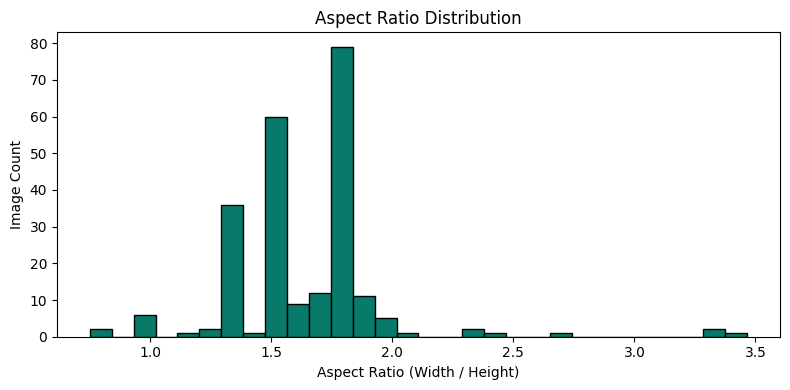

In [34]:
check_aspect_ratio(train_masks)

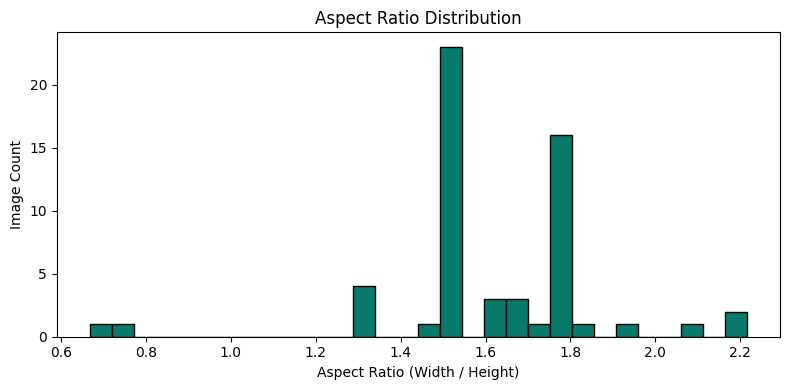

In [35]:
check_aspect_ratio(val_images)

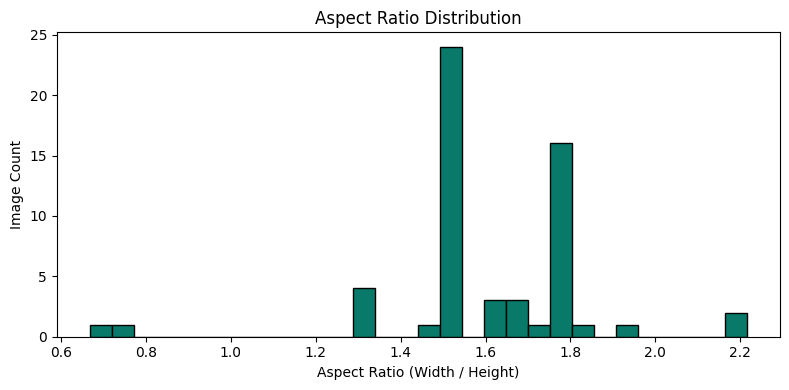

In [36]:
check_aspect_ratio(val_masks)

> The dataset contains images with non-square and varied aspect ratios, primarily clustered around 1.5 and 1.75, indicating that most images are wider than they are tall.  
> This is an important observation, as deep learning models require a fixed input size. Therefore, all images must be resized to a consistent shape during preprocessing to ensure compatibility and performance.

#### CHECK UNIQUE DATA TYPES

In [37]:
def check_unique_datatypes(file_list):
    dtypes = set()
    dtype_map = {}

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                arr = np.array(img)
                dtype = str(arr.dtype)
                dtypes.add(dtype)

                if dtype not in dtype_map:
                    dtype_map[dtype] = []
                dtype_map[dtype].append(norm_path)
        except Exception as e:
            print(f"Failed to read {norm_path}: {e}")

    print(f"Unique data types: {len(dtypes)}")
    print(f"Data types: {sorted(dtypes)}")

In [38]:
check_unique_datatypes(train_images)

Unique data types: 1
Data types: ['uint8']


In [39]:
check_unique_datatypes(train_masks)

Unique data types: 1
Data types: ['uint8']


In [40]:
check_unique_datatypes(val_images)

Unique data types: 1
Data types: ['uint8']


In [41]:
check_unique_datatypes(val_masks)

Unique data types: 1
Data types: ['uint8']


> Based on the unique datatype check above, it's known that all the images have the same datatype, uint8.

#### CHECK UNIQUE FILE TYPES

In [42]:
def check_unique_filetypes(file_list):
    formats = set()
    format_map = {}

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                fmt = img.format.upper()
                formats.add(fmt)

                if fmt not in format_map:
                    format_map[fmt] = []
                format_map[fmt].append(norm_path)
        except Exception as e:
            print(f"Failed to read {norm_path}: {e}")

    print(f"Unique file types: {len(formats)}")
    print(f"File types: {sorted(formats)}")

In [43]:
check_unique_filetypes(train_images)

Unique file types: 4
File types: ['GIF', 'JPEG', 'PNG', 'WEBP']


In [44]:
check_unique_filetypes(train_masks)

Unique file types: 1
File types: ['PNG']


In [45]:
check_unique_filetypes(val_images)

Unique file types: 3
File types: ['JPEG', 'PNG', 'WEBP']


In [46]:
check_unique_filetypes(val_masks)

Unique file types: 1
File types: ['PNG']


> Based on the unique filetype check, the dataset contains several formats: GIF, JPEG, PNG, and WEBP. This is a crucial finding, as different file formats may carry different numbers of color channels, and thus the data should be standardized before training.

#### CHECK UNIQUE NUMBER OF CHANNELS

In [47]:
def check_channels(file_list):
    channel_count = {}
    channel_map = {}

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                mode = img.mode
                num_channels = len(img.getbands())

                if num_channels not in channel_count:
                    channel_count[num_channels] = 0
                    channel_map[num_channels] = []
                channel_count[num_channels] += 1
                channel_map[num_channels].append(norm_path)
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")

    print(f"Number of unique channel counts: {len(channel_count)}")
    for ch, count in channel_count.items():
        print(f"{ch} Channels: {count} images")

In [48]:
check_channels(train_images)

Number of unique channel counts: 3
3 Channels: 229 images
4 Channels: 1 images
1 Channels: 2 images


In [49]:
check_channels(train_masks)

Number of unique channel counts: 1
1 Channels: 232 images


In [50]:
check_channels(val_images)

Number of unique channel counts: 1
3 Channels: 58 images


In [51]:
check_channels(val_masks)

Number of unique channel counts: 1
1 Channels: 58 images


> Aligning with the earlier filetype check, the channel distribution varies in the training images:
> - 229 images are RGB (3 channels),
> - 2 grayscale images (1 channel).
> - 1 image with 4 channels, likely a PNG or WEBP with an alpha channel.
>
> Validation images are consistently RGB (3 channels), while all masks (train and validation) are 1-channel grayscale.

#### CHECK BRIGHTNESS AND CONTRAST

In [52]:
def check_bright_contrast(file_list, show_plot = True):
    brightness = []
    contrast = []

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                img = img.convert("L")
                arr = np.array(img).astype(np.float32)

                b = np.mean(arr)
                brightness.append(b)

                c = np.std(arr)
                contrast.append(c)
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")

    print(f"Processed {len(brightness)} images.")
    print(f"Brightness range: {min(brightness):.2f} - {max(brightness):.2f}")
    print(f"Contrast range: {min(contrast):.2f} - {max(contrast):.2f}")

    if show_plot:
        mean_brightness = np.mean(brightness)
        mean_contrast = np.mean(contrast)
        
        plt.figure(figsize = (12, 5))
        plt.subplot(1, 2, 1)
        plt.hist(brightness, bins = 30, color = "#097969", edgecolor = "black")
        plt.axvline(mean_brightness, color = "red", linestyle = "dashed", linewidth = 2, label = f"Mean: {mean_brightness:.2f}")
        plt.title("Brightness Distribution")
        plt.xlabel("Brightness (mean pixel value)")
        plt.ylabel("Image Count")
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.hist(contrast, bins = 30, color = "#097969", edgecolor = "black")
        plt.axvline(mean_contrast, color = "red", linestyle = "dashed", linewidth = 2, label = f"Mean: {mean_contrast:.2f}")
        plt.title("Contrast Distribution")
        plt.xlabel("Contrast (pixel stdev)")
        plt.ylabel("Image Count")
        plt.legend()

        plt.tight_layout()
        plt.show()

Processed 232 images.
Brightness range: 57.28 - 189.49
Contrast range: 25.24 - 83.38


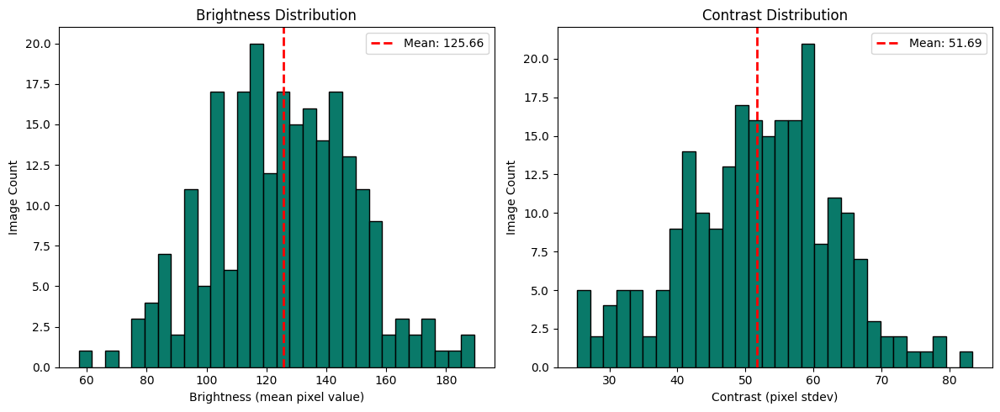

In [53]:
check_bright_contrast(train_images)

Processed 232 images.
Brightness range: 10.86 - 224.07
Contrast range: 51.22 - 127.20


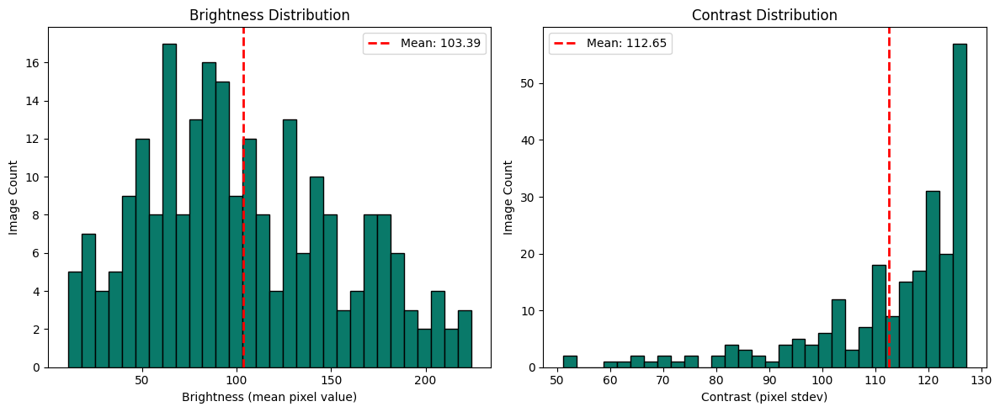

In [54]:
check_bright_contrast(train_masks)

Processed 58 images.
Brightness range: 60.59 - 184.60
Contrast range: 29.12 - 72.11


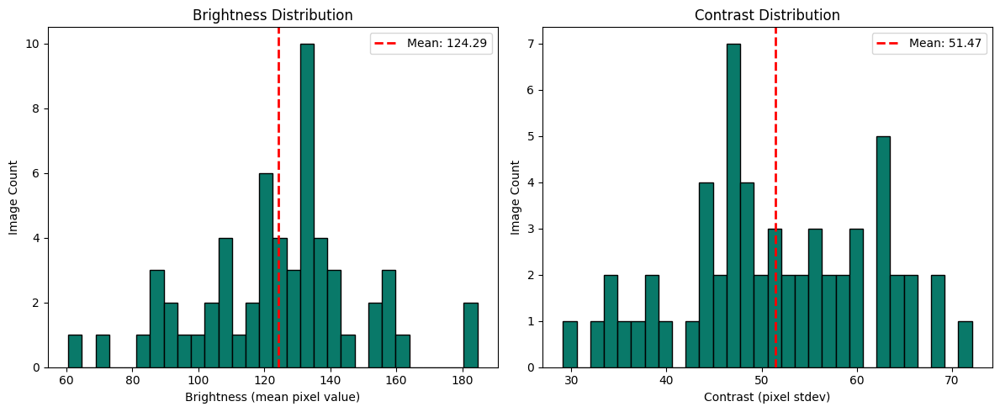

In [55]:
check_bright_contrast(val_images)

Processed 58 images.
Brightness range: 34.79 - 223.33
Contrast range: 83.98 - 127.18


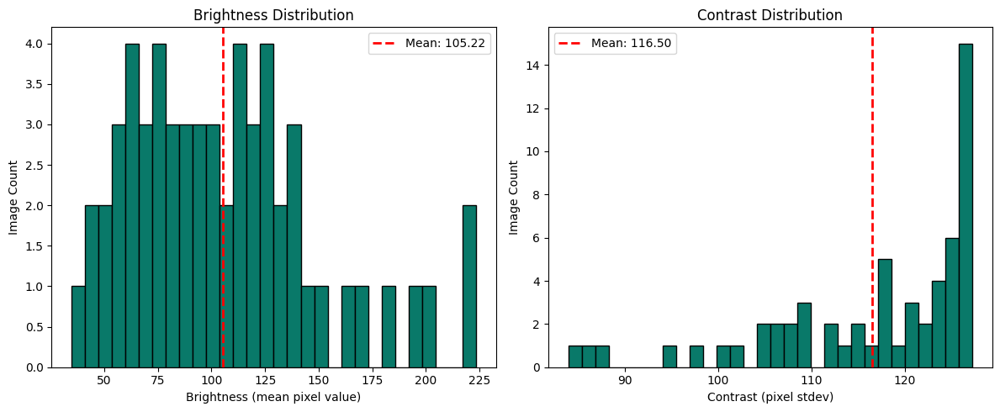

In [56]:
check_bright_contrast(val_masks)

> Based on the brightness and contrast distribution checking above, it's shown that:
> - Training images have a brightness range of 57.28 - 189.49 (mean: 125.66) and a contrast range of 25.24 - 83.38 (mean: 51.69). The distributions are moderately spread and well-centered, indicating consistent image quality.
> - Training masks show a wider brightness range from 10.86 - 224.07 (mean: 103.39) and much higher contrast ranging from 51.22 - 127.20 (mean: 112.65). This reflects the sharp pixel intensity differences typical in masks, such as edges or segmentation boundaries.
> - Validation images display similar patterns to the training images, with a brightness range of 60.59 - 184.60 (mean: 124.29) and a contrast range of 29.12 - 72.11 (mean: 51.47), suggesting good consistency across datasets.
> - Validation masks also follow the trend seen in training masks, with brightness ranging from 34.79 - 223.33 (mean: 105.22) and contrast from 83.98 - 127.18 (mean: 116.50), again indicating high edge variation.  
> 
> Overall, the data distributions between training and validation sets are well aligned, with masks exhibiting significantly higher contrast than the images — which is expected in segmentation tasks.

#### CHECK COLOR DISTRIBUTION

In [57]:
def check_color_distribution(file_list, show_plot = True, single_image = False):
    red_hist = np.zeros(256)
    green_hist = np.zeros(256)
    blue_hist = np.zeros(256)
    total_images = 0

    if single_image:
        file_list = file_list[:1]

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                img = img.convert("RGB")
                r, g, b = img.split()
                r_arr = np.array(r).flatten()
                g_arr = np.array(g).flatten()
                b_arr = np.array(b).flatten()

                red_hist += np.bincount(r_arr, minlength = 256)
                green_hist += np.bincount(g_arr, minlength = 256)
                blue_hist += np.bincount(b_arr, minlength = 256)

                total_images += 1
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")
    print(f"Processed {total_images} images.")

    if show_plot:
        red_mean = np.average(np.arange(256), weights = red_hist)
        green_mean = np.average(np.arange(256), weights = green_hist)
        blue_mean = np.average(np.arange(256), weights = blue_hist)
        
        plt.figure(figsize = (10, 15))

        plt.subplot(3, 1, 1)
        plt.bar(range(256), red_hist, color = "red")
        plt.axvline(red_mean, color = "black", linestyle = "dashed", linewidth = 2, label = f"Mean: {red_mean:.2f}")
        plt.title("Red Color Distribution")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.legend()

        plt.subplot(3, 1, 2)
        plt.bar(range(256), green_hist, color = "green")
        plt.axvline(green_mean, color = "black", linestyle = "dashed", linewidth = 2, label = f"Mean: {green_mean:.2f}")
        plt.title("Green Color Distribution")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.legend()

        plt.subplot(3, 1, 3)
        plt.bar(range(256), blue_hist, color = "blue")
        plt.axvline(blue_mean, color = "black", linestyle = "dashed", linewidth = 2, label = f"Mean: {blue_mean:.2f}")
        plt.title("Blue Color Distribution")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.legend()
        
        plt.tight_layout()
        plt.show()

Processed 1 images.


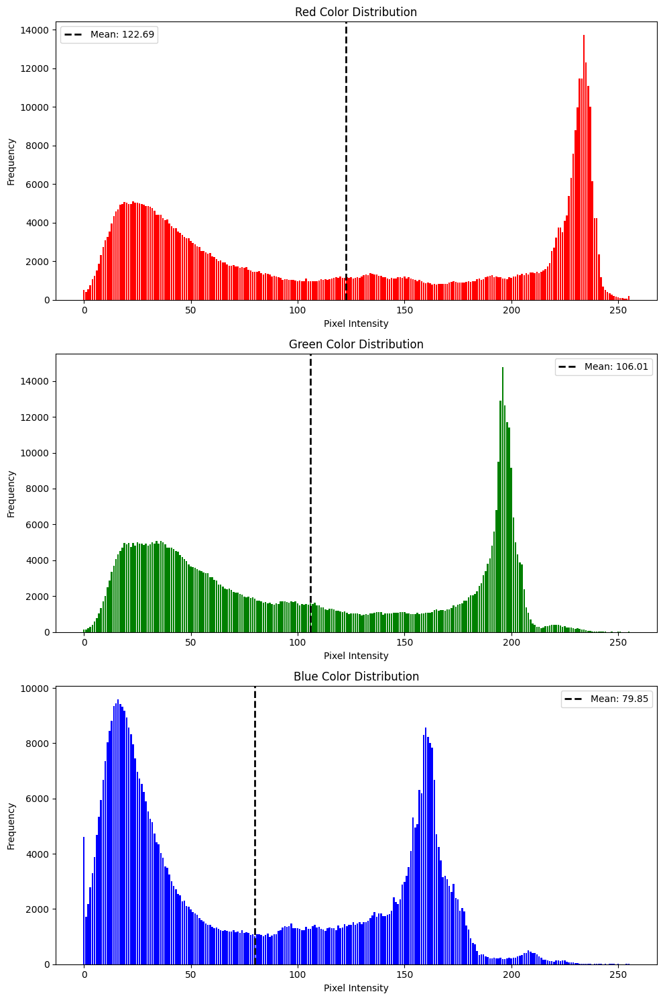

In [58]:
check_color_distribution(train_images, single_image = True)

> Based on the color distribution check above:
> - Red Channel: With a mean intensity of 122.69, the red channel shows a bimodal distribution, one peak at lower intensities (around 30-60) and another prominent peak near 240. This suggests a contrast between darker regions, such as muddy or shaded areas, and brighter surfaces, possibly dry land, rooftops, or structures reflecting strong red light.
> - Green Channel: With a mean intensity of 106.01, the green channel also displays a bimodal distribution. The first peak lies around 30-70, and the second one near 190-200. This indicates a mix of vegetated areas or shaded flood zones (low intensity) and brighter, possibly non-flooded land.
> - Blue Channel: The blue channel has the lowest mean intensity, at 79.85, and a strong peak around 20-40, along with a smaller peak near 150-160. This distribution implies that the image contains large dark blue areas, which likely correspond to water or flood zones, making blue a key channel for flood detection.

Processed 1 images.


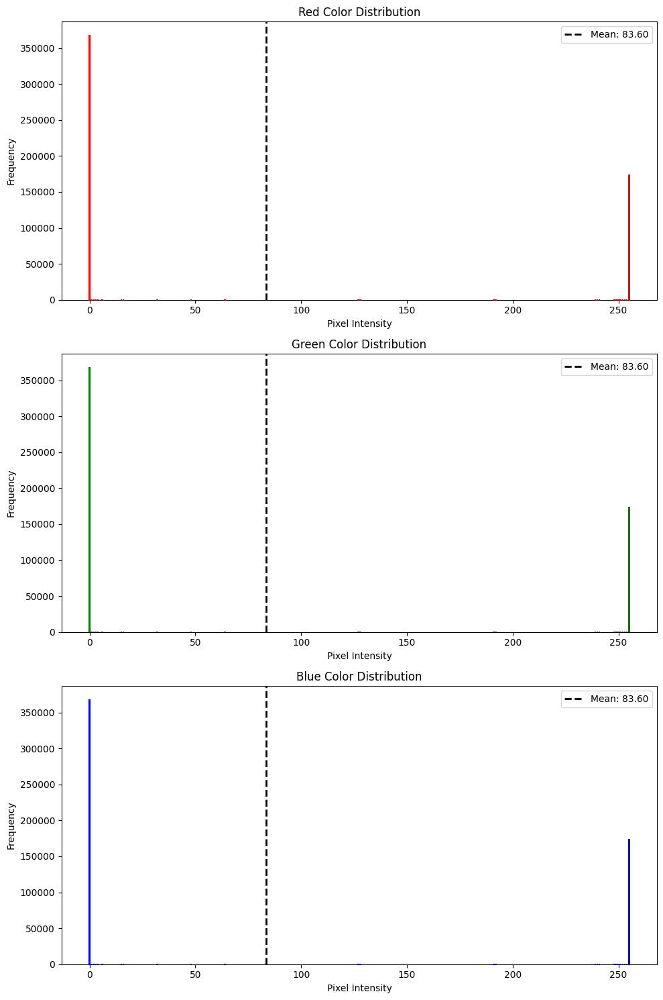

In [59]:
check_color_distribution(train_masks, single_image = True)

> Based on the color distribution check above:
> - Red Channel: The red channel shows a binary distribution with two sharp peaks at 0 and 255, and a mean intensity of 83.60. This pattern suggests that the image is not a typical RGB photo, but rather a segmentation mask where pixel values represent class labels, 0 for background and 255 for flood or target areas. The absence of intermediate values confirms the binary nature of the data.
> - Green Channel: The green channel mirrors the red channel exactly, with peaks only at 0 and 255, and the same mean intensity of 83.60. This indicates that the segmentation mask is uniform across all color channels, likely due to it being stored as an RGB image even though it contains grayscale class data.
> - Blue Channel: Similarly, the blue channel has the same binary peak distribution and mean value. This further confirms that the image functions as a label mask for segmentation and does not contain natural color variation.

Processed 1 images.


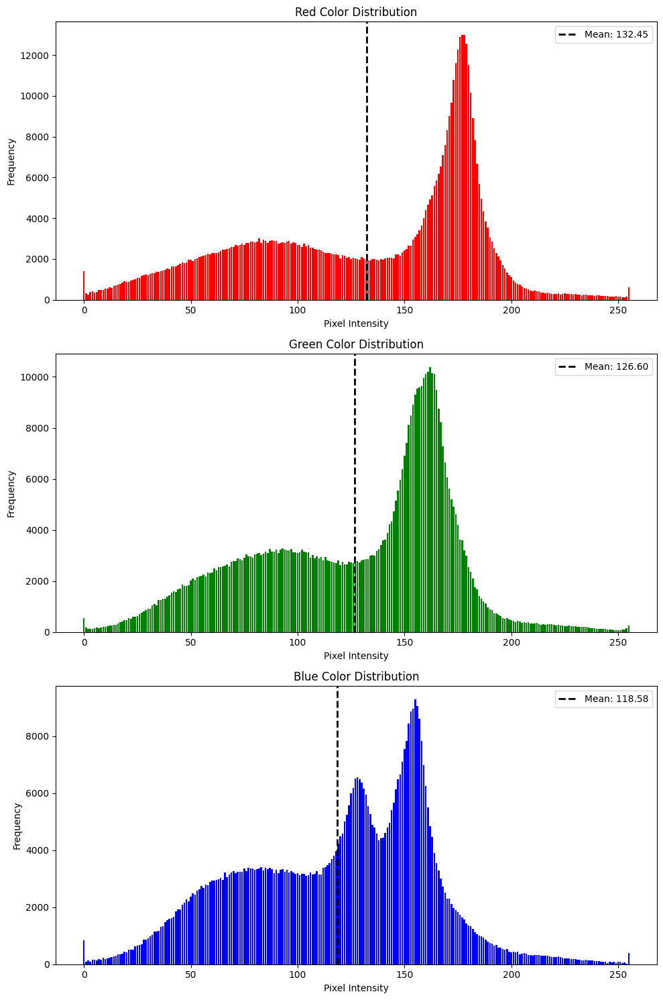

In [60]:
check_color_distribution(val_images, single_image = True)

> Based on the color distribution check above:
> - Red Channel: With a mean intensity of 132.45, the red channel shows a multimodal distribution, with a noticeable concentration of pixels in the high-intensity range (around 180-190). This indicates the presence of bright red areas, which may correspond to sunlit surfaces, infrastructure, or dry land. The gradual buildup at lower intensities also suggests a mix of shadows or darker regions.
> - Green Channel: The green channel has a mean intensity of 126.60 and displays a bimodal distribution with two peaks, one around 60-120 and another around 160-180. This pattern reflects the diversity in vegetation brightness, possibly capturing both shaded and sunlit vegetation or ground areas, which is useful in distinguishing terrain types in flood analysis.
> - Blue Channel: With a mean intensity of 118.58, the blue channel has a wider, more spread-out distribution and multiple peaks, including around 60-90, 130, and 180. This suggests the presence of varied blue tones, commonly found in flooded water surfaces, shadows, or sky reflections, making it an important feature in identifying flooded regions.

Processed 1 images.


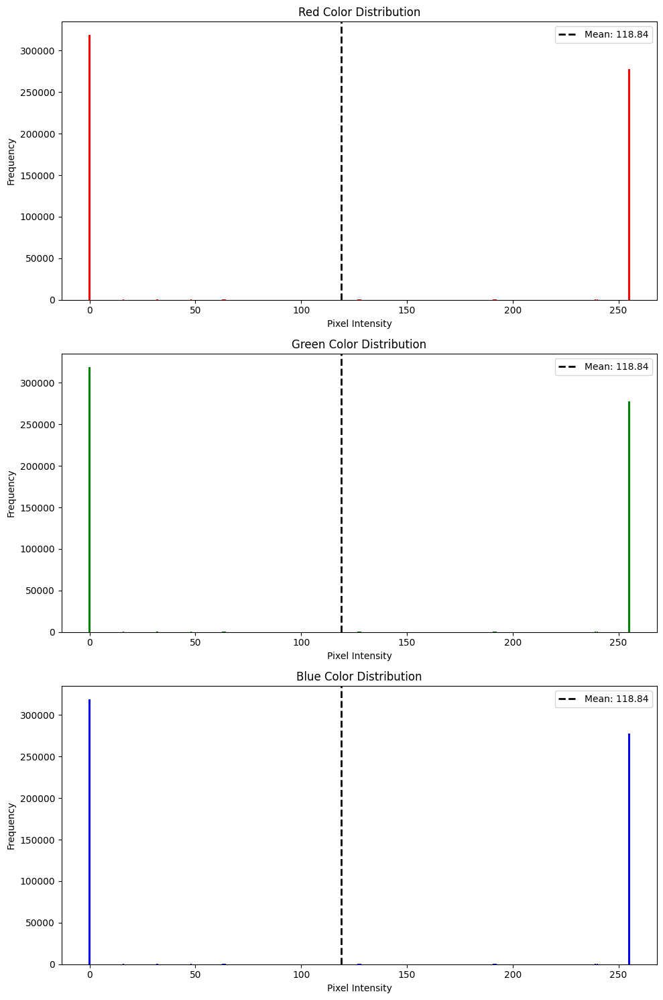

In [61]:
check_color_distribution(val_masks, single_image = True)

> Based on the color distribution check above:
> - Red Channel: The red channel exhibits a binary-like distribution, with two sharp spikes at 0 and 255, and a mean intensity of 118.84. This suggests that the image contains only two dominant intensity values, pure black and pure white, indicating it is likely a segmentation mask encoded in RGB format, where different regions are labeled using distinct values (e.g., 0 = background, 255 = foreground/flooded area).
> - Green Channel: The green channel shows an identical pattern to the red channel, with peaks only at 0 and 255, and the same mean intensity. This confirms that the image has no color variation across channels and is likely a grayscale label mask stored in RGB form.
> - Blue Channel: Similarly, the blue channel matches the distribution of red and green, further confirming the image is not a natural RGB image, but rather a class mask where each pixel's value represents a category (e.g., flood or non-flood).

#### CHECK SHARPNESS

In [62]:
def check_sharpness(file_list, show_plot = True, show_blurry = True, threshold = 100, max_images = 21):
    sharpness_scores = []
    blurry_images = []
    total_images = 0

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                img_gray = np.array(img.convert("L"))

            laplacian = cv2.Laplacian(img_gray, cv2.CV_64F)
            variance = laplacian.var()
            sharpness_scores.append(variance)
            total_images += 1

            if show_blurry and variance < threshold:
                blurry_images.append((norm_path, variance))
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")
    print(f"Processed {total_images} images.")
    if total_images == 0:
        return []

    print(f"Sharpness range: {min(sharpness_scores):.2f} - {max(sharpness_scores):.2f}")
    print(f"Mean sharpness: {np.mean(sharpness_scores):.2f}")

    if show_plot:
        mean_sharpness = np.mean(sharpness_scores)
        plt.figure(figsize = (8, 5))
        plt.hist(sharpness_scores, bins = 30, color = "#097969", edgecolor = "black")
        plt.axvline(mean_sharpness, color = "red", linestyle = "dashed", linewidth = 2, label = f"Mean: {mean_sharpness:.2f}")
        plt.title("Sharpness Distribution")
        plt.xlabel("Sharpness Score")
        plt.ylabel("Image Count")
        plt.legend()
        plt.tight_layout()
        plt.show()

    if show_blurry and blurry_images:
        blurry_images.sort(key = lambda x: x[1])
        print(f"Found {len(blurry_images)} blurry images.")

        num_show = min(max_images, len(blurry_images))
        cols = 3
        rows = (num_show + cols - 1) // cols

        plt.figure(figsize = (4 * cols, 4 * rows))
        for idx, (img_path, sharpness) in enumerate(blurry_images[:num_show]):
            img = Image.open(img_path).convert("RGB")
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img)
            plt.title(f"{os.path.basename(img_path)}\nSharpness: {sharpness:.2f}")
            plt.axis("off")
        plt.tight_layout()
        plt.show()

    return blurry_images

Processed 232 images.
Sharpness range: 9.16 - 20107.01
Mean sharpness: 1491.23


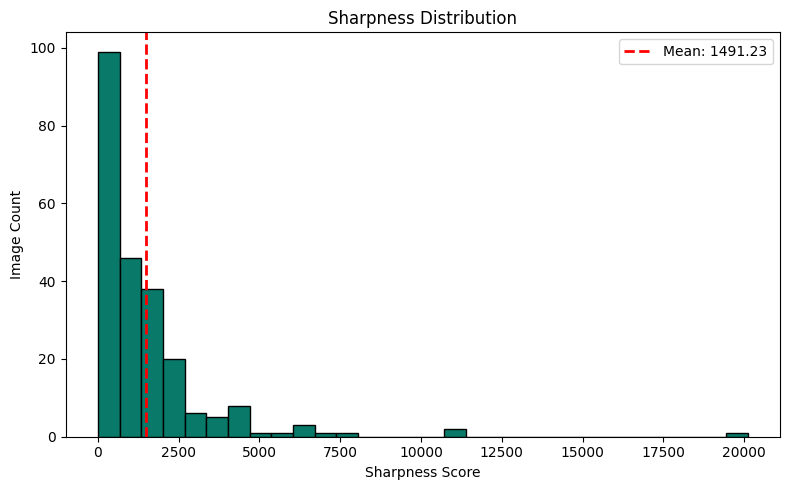

Found 15 blurry images.


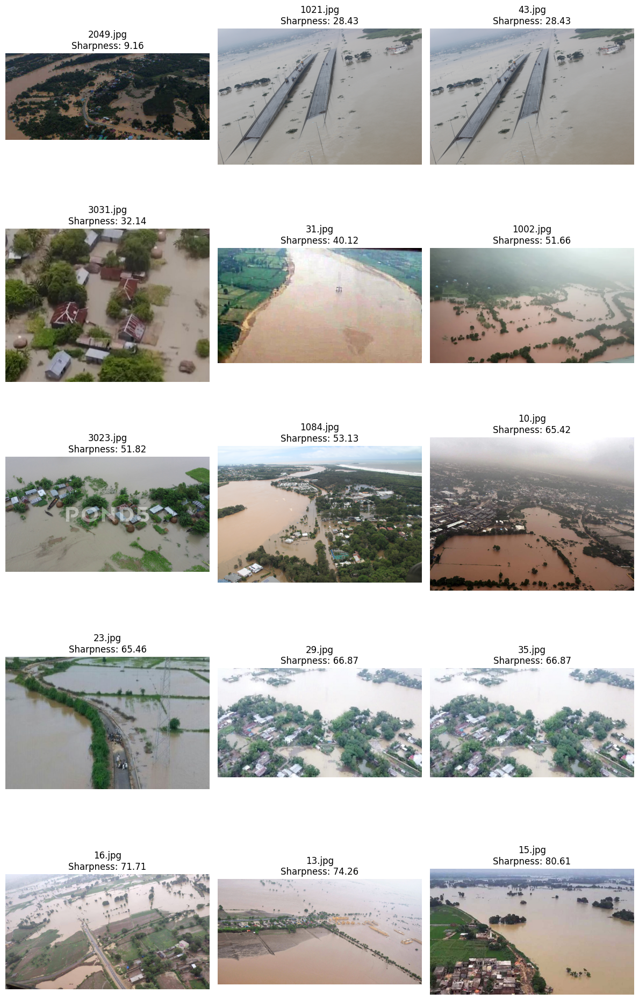

[('archive\\Image\\2049.jpg', 9.156289950027805),
 ('archive\\Image\\1021.jpg', 28.42752149135181),
 ('archive\\Image\\43.jpg', 28.42752149135181),
 ('archive\\Image\\3031.jpg', 32.14481156659723),
 ('archive\\Image\\31.jpg', 40.12255186691423),
 ('archive\\Image\\1002.jpg', 51.65695697940083),
 ('archive\\Image\\3023.jpg', 51.824296873908814),
 ('archive\\Image\\1084.jpg', 53.126404449205424),
 ('archive\\Image\\10.jpg', 65.42107730533604),
 ('archive\\Image\\23.jpg', 65.45935356132934),
 ('archive\\Image\\29.jpg', 66.866205102192),
 ('archive\\Image\\35.jpg', 66.866205102192),
 ('archive\\Image\\16.jpg', 71.70742499984377),
 ('archive\\Image\\13.jpg', 74.26190068225567),
 ('archive\\Image\\15.jpg', 80.61197197342975)]

In [63]:
check_sharpness(train_images)

Processed 232 images.
Sharpness range: 59.04 - 4024.87
Mean sharpness: 1111.55


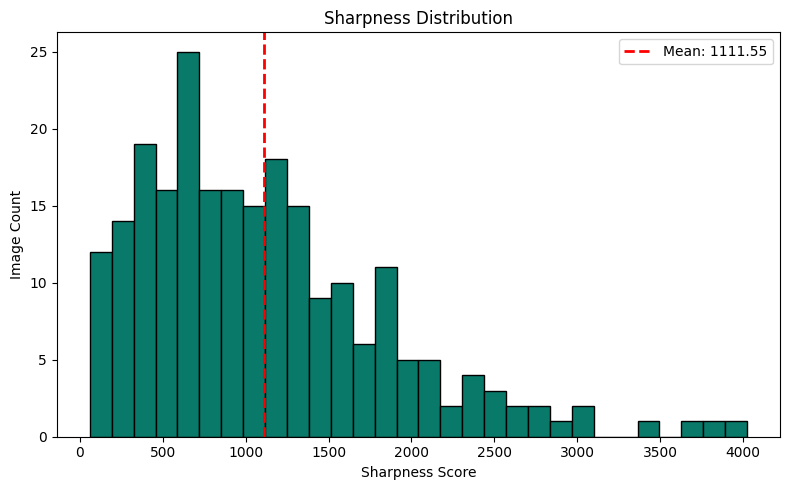

Found 3 blurry images.


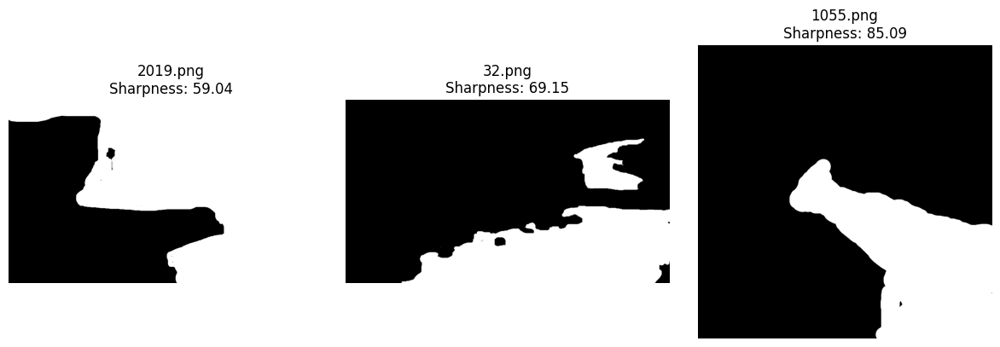

[('archive\\Mask\\2019.png', 59.044989844729294),
 ('archive\\Mask\\32.png', 69.15458454270873),
 ('archive\\Mask\\1055.png', 85.09251506799946)]

In [64]:
check_sharpness(train_masks)

Processed 58 images.
Sharpness range: 47.96 - 10750.61
Mean sharpness: 1591.65


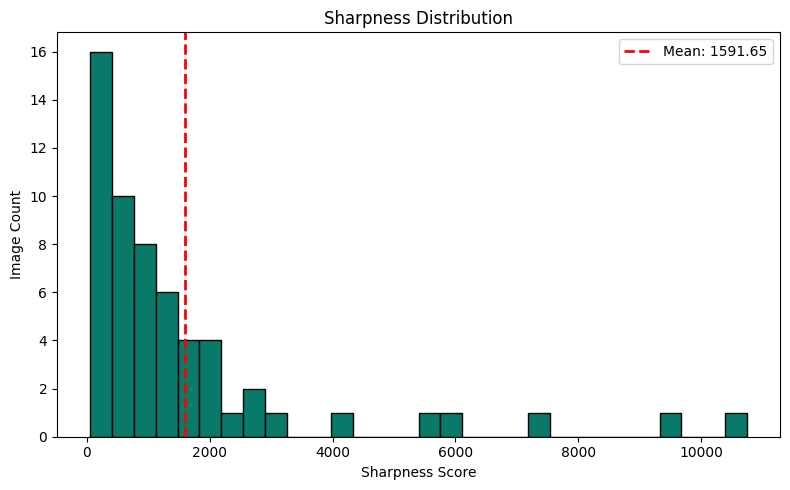

Found 6 blurry images.


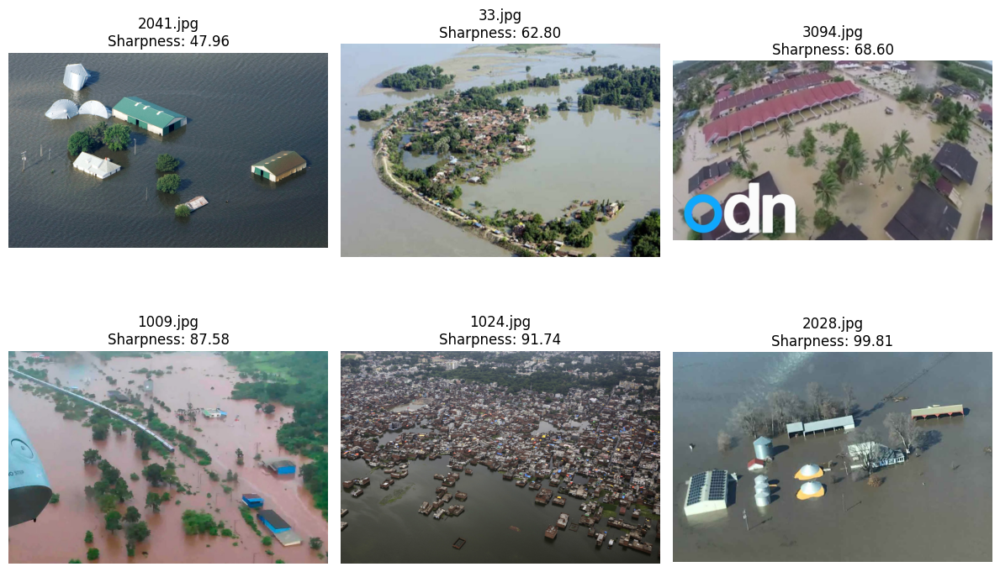

[('archive\\Image\\2041.jpg', 47.96156242075263),
 ('archive\\Image\\33.jpg', 62.80189128746094),
 ('archive\\Image\\3094.jpg', 68.60154139991923),
 ('archive\\Image\\1009.jpg', 87.5771435877243),
 ('archive\\Image\\1024.jpg', 91.73786772213343),
 ('archive\\Image\\2028.jpg', 99.81013120577116)]

In [65]:
check_sharpness(val_images)

Processed 58 images.
Sharpness range: 148.75 - 2988.03
Mean sharpness: 1161.06


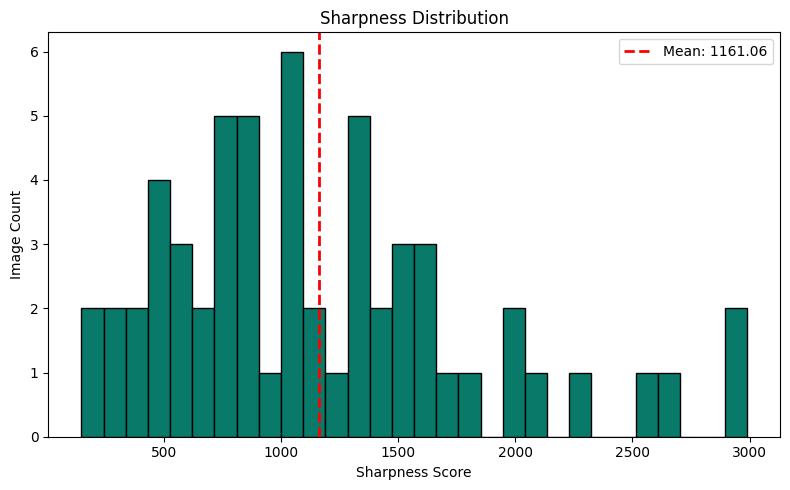

[]

In [66]:
check_sharpness(val_masks)

> Based on the sharpness check above:
> - Train images has the sharpness range from 9.16 to 20107.01 with 15 images identified as blurry.
> - Train masks has the sharpness range from 59.04 to 4024.87 with 3 images identified as blurry.
> - Validation images has the sharpness range from 47.96 to 10750.61 with 6 images identified as blurry.
> - Validation masks has the sharpness range from 148.75 to 2988.03 with 0 image identified as blurry.

#### CHECK GRAININESS

In [67]:
def check_graininess(file_list, show_plot = True, show_images = True, threshold = 15, max_images = 21):
    graininess_scores = []
    grainy_images = []
    total_images = 0

    for path in file_list:
        norm_path = os.path.normpath(path)
        try:
            with Image.open(norm_path) as img:
                gray = np.array(img.convert("L"))
            blurred = cv2.GaussianBlur(gray, (3, 3), 0)
            noise = cv2.absdiff(gray, blurred)
            graininess = np.std(noise)
            graininess_scores.append(graininess)
            total_images += 1

            if show_images and graininess >= threshold:
                grainy_images.append((norm_path, graininess))
        except Exception as e:
            print(f"Failed to process {norm_path}: {e}")

    print(f"Processed {total_images} images.")
    if total_images == 0:
        return []

    print(f"Graininess range: {min(graininess_scores):.2f} - {max(graininess_scores):.2f}")
    print(f"Mean graininess: {np.mean(graininess_scores):.2f}")

    if show_plot:
        mean_graininess = np.mean(graininess_scores)
        plt.figure(figsize = (8, 5))
        plt.hist(graininess_scores, bins = 30, color = "#097969", edgecolor = "black")
        plt.axvline(mean_graininess, color = "red", linestyle = "dashed", linewidth = 2, label = f"Mean: {mean_graininess:.2f}")
        plt.title("Graininess Distribution")
        plt.xlabel("Graininess")
        plt.ylabel("Image Count")
        plt.legend()
        plt.tight_layout()
        plt.show()

    if show_images and grainy_images:
        grainy_images.sort(key = lambda x: x[1], reverse = True)
    print(f"Found {len(grainy_images)} grainy images.")
    num_show = min(max_images, len(grainy_images))
    cols = 3
    rows = (num_show + cols - 1) // cols

    plt.figure(figsize = (4 * cols, 4 * rows))
    for idx, (img_path, grain_score) in enumerate(grainy_images[:num_show]):
        img = Image.open(img_path).convert("RGB")
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        plt.title(f"{os.path.basename(img_path)}\nGraininess: {grain_score:.2f}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()
    
    return grainy_images

Processed 232 images.
Graininess range: 0.62 - 20.49
Mean graininess: 5.76


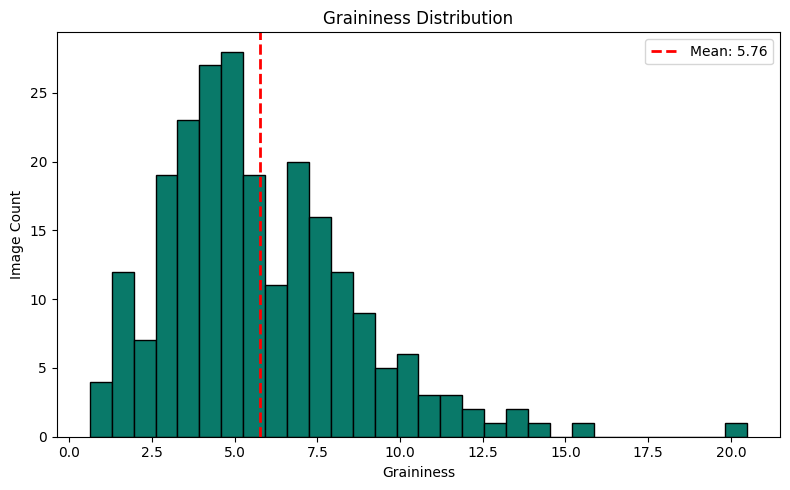

Found 2 grainy images.


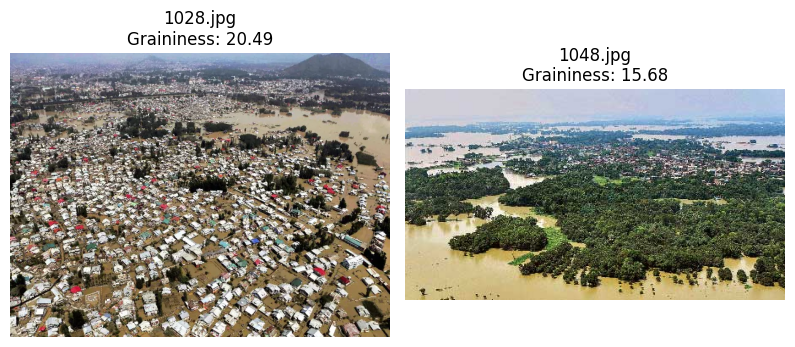

[('archive\\Image\\1028.jpg', 20.489503354912788),
 ('archive\\Image\\1048.jpg', 15.683582782021256)]

In [68]:
check_graininess(train_images)

Processed 232 images.
Graininess range: 1.74 - 13.90
Mean graininess: 6.74


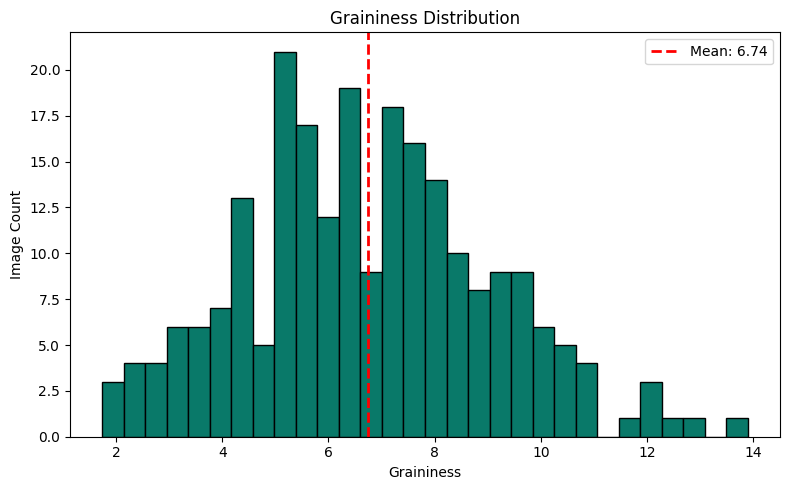

Found 0 grainy images.


<Figure size 1200x0 with 0 Axes>

[]

In [69]:
check_graininess(train_masks)

Processed 58 images.
Graininess range: 1.21 - 15.72
Mean graininess: 5.86


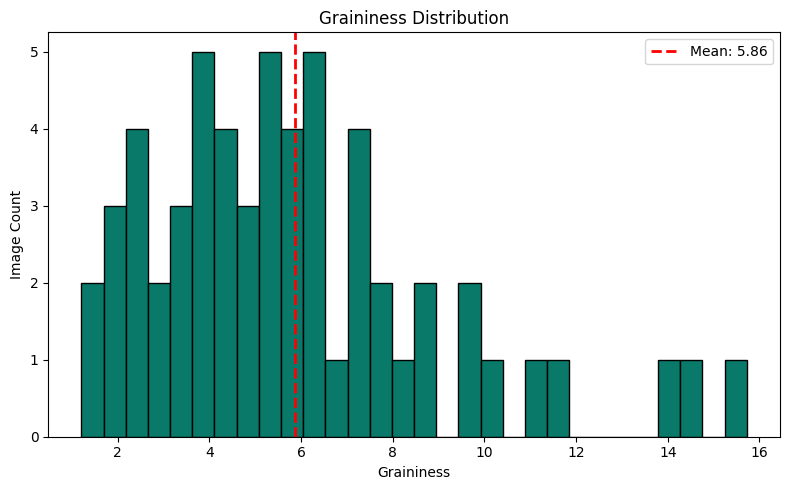

Found 1 grainy images.


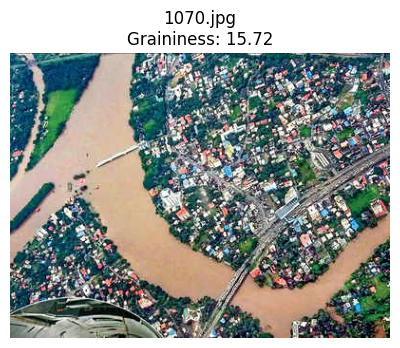

[('archive\\Image\\1070.jpg', 15.723346978219999)]

In [70]:
check_graininess(val_images)

Processed 58 images.
Graininess range: 2.72 - 12.15
Mean graininess: 7.05


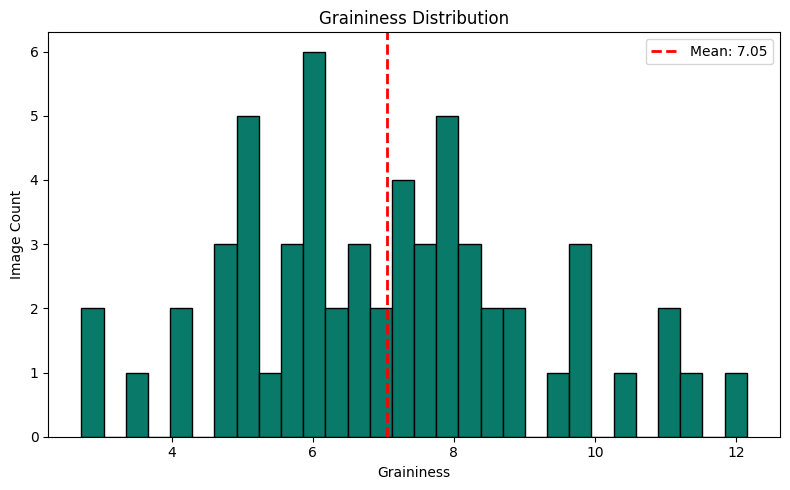

Found 0 grainy images.


<Figure size 1200x0 with 0 Axes>

[]

In [71]:
check_graininess(val_masks)

> Based on the sharpness check above:
> - Train images has the graininess range from 0.62 to 20.49 with 2 images identified as grainy.
> - Train masks has the graininess range from 1.74 to 13.90 with 0 image identified as grainy.
> - Validation images has the graininess range from 1.21 to 15.72 with 1 image identified as grainy.
> - Validation masks has the graininess range from 2.72 to 12.15 with 0 image identified as grainy.

### PREPROCESSING

#### REMOVE DUPLICATED IMAGE

In [72]:
def remove_duplicated(duplicated_image, image_list, mask_list, metadata_path, image_dir = "Image", mask_dir = "Mask"):
    df = pd.read_csv(metadata_path)
    removed_count = 0
    removed_images = set()
    for dup, _ in duplicated_image:
        norm_dup = os.path.normpath(dup)
        image_name = os.path.basename(norm_dup)
        row = df[df["Image"] == image_name]
        if not row.empty:
            mask_name = row.iloc[0]["Mask"]
            mask_path = os.path.normpath(os.path.join(mask_dir, mask_name))

        if os.path.exists(mask_path):
            try:
                os.remove(mask_path)
                print(f"Remove corresponding mask: {mask_path}")
                if mask_path in mask_list:
                    mask_list.remove(mask_path)
            except Exception as e:
                print(f"Failed to remove mask {mask_path}: {e}")
        else:
            print(f"[WARNING] Metadata not found for image {image_name}")
            continue

        if os.path.exists(norm_dup):
            try:
                os.remove(norm_dup)
                print(f"Remove duplicate image: {norm_dup}")
                if norm_dup in image_list:
                    image_list.remove(norm_dup)
                    removed_images.add(image_name)
                    removed_count += 1
            except Exception as e:
                print(f"Failed to remove image {norm_dup}: {e}")

    df = df[~df["Image"].isin(removed_images)]  
    df.to_csv(metadata_path,
              index = False)
    print(f"Removed {removed_count} duplicated images.")

In [73]:
remove_duplicated(
    check_duplicated(train_images),
    image_list = train_images,
    mask_list = train_masks,
    metadata_path = "./archive/metadata.csv",
    image_dir = "./archive/Image",
    mask_dir = "./archive/Mask"
)

Total duplicates found: 6
Remove corresponding mask: archive\Mask\1049.png
Remove duplicate image: archive\Image\1049.jpg
Remove corresponding mask: archive\Mask\3020.png
Remove duplicate image: archive\Image\3020.jpg
Remove corresponding mask: archive\Mask\43.png
Remove duplicate image: archive\Image\43.jpg
Remove corresponding mask: archive\Mask\1041.png
Remove duplicate image: archive\Image\1041.jpg
Remove corresponding mask: archive\Mask\1033.png
Remove duplicate image: archive\Image\1033.jpg
Remove corresponding mask: archive\Mask\1012.png
Remove duplicate image: archive\Image\1012.jpg
Removed 6 duplicated images.


In [74]:
check_duplicated(train_images)

Total duplicates found: 0


[]

In [75]:
remove_duplicated(
    check_duplicated(val_images),
    image_list = val_images,
    mask_list = val_masks,
    metadata_path = "./archive/metadata.csv",
    image_dir = "./archive/Image",
    mask_dir = "./archive/Mask"
)

Total duplicates found: 0
Removed 0 duplicated images.


> All duplicate pairs have been successfully removed, ensuring a clean dataset for further modeling.

### MODELLING AND EVALUATION

In [76]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, mask_paths, batch_size=32, shuffle=True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_img_paths = [self.image_paths[k] for k in indexes]
        batch_mask_paths = [self.mask_paths[k] for k in indexes]

        X, y = self.__data_generation(batch_img_paths, batch_mask_paths)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, batch_img_paths, batch_mask_paths):
        X = np.empty((self.batch_size, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)
        y = np.empty((self.batch_size, IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_img_paths, batch_mask_paths)):
            X[i,] = read_image(img_path)
            y[i,] = read_mask(mask_path)

        return X, y

In [77]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 
               3, 
               padding = "same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 
               3, 
               padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

In [78]:
def encoder_block(inputs, num_filters):
    s = conv_block(inputs, 
                   num_filters)
    p = MaxPool2D((2, 2))(s)
    return s, p

In [79]:
def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, 
                        (2, 2), 
                        strides = 2, 
                        padding = "same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, 
                   num_filters)
    return x

In [80]:
def build_unet(input_shape):
    inputs = Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bottleneck
    bn = conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(bn, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output Layer
    outputs = Conv2D(1, 
                     1, 
                     padding = "same", 
                     activation = "sigmoid")(d4)

    model = Model(inputs, 
                  outputs, 
                  name = "U-Net")
    return model

In [81]:
def iou(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.cast(tf.reshape(y_pred > 0.5, [-1]), tf.float32)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

In [82]:
train_generator = DataGenerator(train_images, 
                                train_masks, 
                                batch_size = BATCH_SIZE)
val_generator = DataGenerator(val_images, 
                              val_masks, 
                              batch_size = BATCH_SIZE, 
                              shuffle = False)

In [83]:
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)
model = build_unet(input_shape)
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = "binary_crossentropy",
              metrics = ["accuracy", iou])
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [84]:
class EarlyStoppingAtMinEpoch(EarlyStopping):
    def __init__(self, start_epoch, **kwargs):
        super(EarlyStoppingAtMinEpoch, self).__init__(**kwargs)
        self.start_epoch = start_epoch
    def on_epoch_end(self, epoch, logs = None):
        if epoch >= self.start_epoch:
            super().on_epoch_end(epoch, logs)

MINIMUM_EPOCH = 50
early_stop_with_warmup = EarlyStoppingAtMinEpoch(
    start_epoch = MINIMUM_EPOCH,
    monitor = "val_iou",
    patience = 10,
    verbose = 1,
    restore_best_weights = True,
    min_delta = 1e-6
)

callbacks = [
    ModelCheckpoint("flood_segmentation_model.keras", 
                    save_best_only = True, 
                    monitor = "val_iou", 
                    mode = "max"),
    ReduceLROnPlateau(monitor = "val_iou", 
                      factor = 0.1, 
                      patience = 5, 
                      mode = "max"),
    early_stop_with_warmup
]

In [85]:
history = model.fit(
    train_generator,
    validation_data = val_generator,
    epochs = EPOCHS,
    callbacks = callbacks
)

Epoch 1/100
[ERROR] Failed to load image: archive\Image\0.jpg - loss: 0.5967 - accuracy: 0.6761 - iou: 0.4955  
56/56 [==============================] - 46s 452ms/step - loss: 0.4548 - accuracy: 0.7798 - iou: 0.6060 - val_loss: 1.0670 - val_accuracy: 0.4001 - val_iou: 0.4132 - lr: 1.0000e-04
Epoch 2/100
[ERROR] Failed to load image: archive\Image\0.jpg- loss: 0.3953 - accuracy: 0.8218 - iou: 0.6474 
56/56 [==============================] - 25s 435ms/step - loss: 0.3818 - accuracy: 0.8273 - iou: 0.6610 - val_loss: 1.0418 - val_accuracy: 0.4001 - val_iou: 0.4132 - lr: 1.0000e-04
Epoch 3/100
[ERROR] Failed to load image: archive\Image\0.jpg
56/56 [==============================] - 24s 432ms/step - loss: 0.3602 - accuracy: 0.8354 - iou: 0.6765 - val_loss: 1.4282 - val_accuracy: 0.4001 - val_iou: 0.4132 - lr: 1.0000e-04
Epoch 4/100
[ERROR] Failed to load image: archive\Image\0.jpg- loss: 0.3543 - accuracy: 0.8362 - iou: 0.6789 
56/56 [==============================] - 26s 455ms/step - loss:

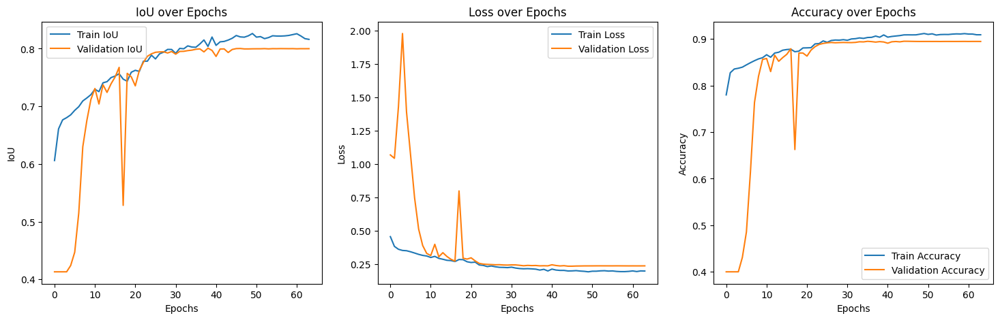

In [86]:
plt.figure(figsize = (18, 5))
plt.subplot(1, 3, 1)
plt.plot(history.history["iou"], 
         label = "Train IoU")
plt.plot(history.history["val_iou"], 
         label = "Validation IoU")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.title("IoU over Epochs")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history.history["loss"], 
         label = "Train Loss")
plt.plot(history.history["val_loss"], 
         label = "Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss over Epochs")
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history.history["accuracy"], 
         label = "Train Accuracy")
plt.plot(history.history["val_accuracy"], 
         label = "Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy over Epochs")
plt.legend()

plt.savefig("training_history.png")
plt.show()

1/1 [==============================] - 2s 2s/step


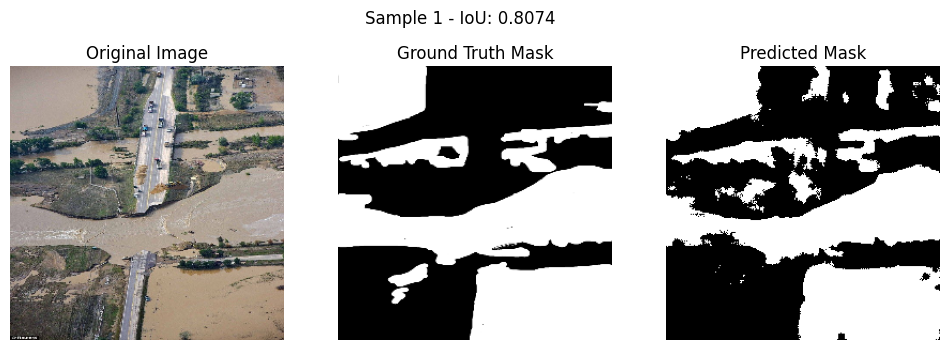

1/1 [==============================] - 0s 61ms/step


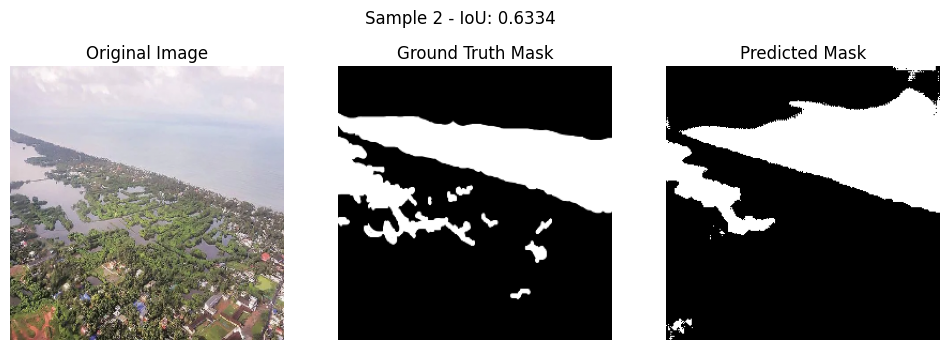

1/1 [==============================] - 0s 51ms/step


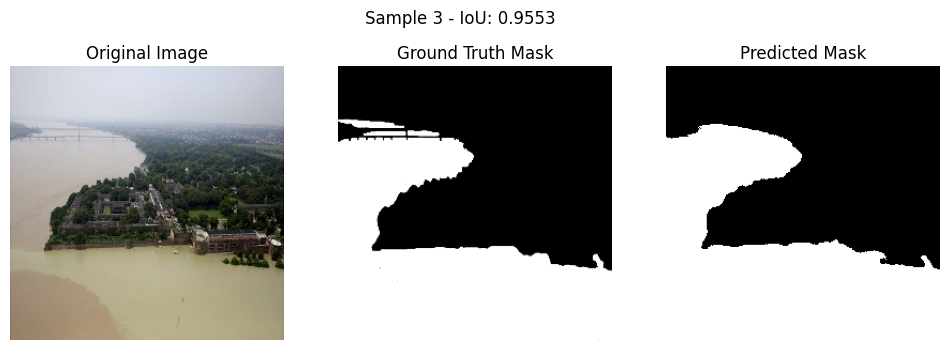

1/1 [==============================] - 0s 52ms/step


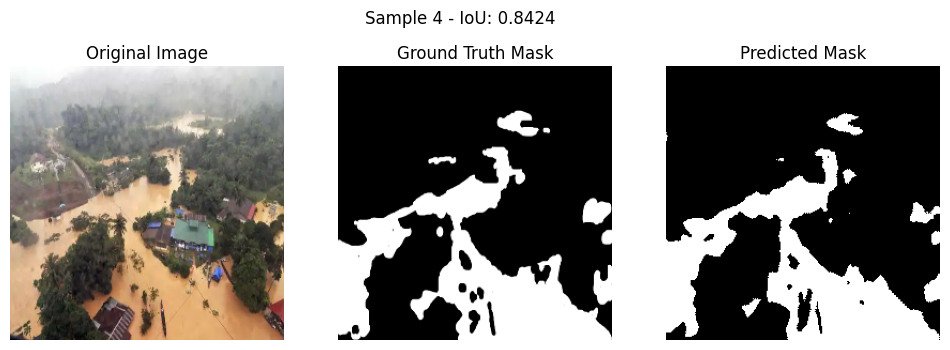

1/1 [==============================] - 0s 52ms/step


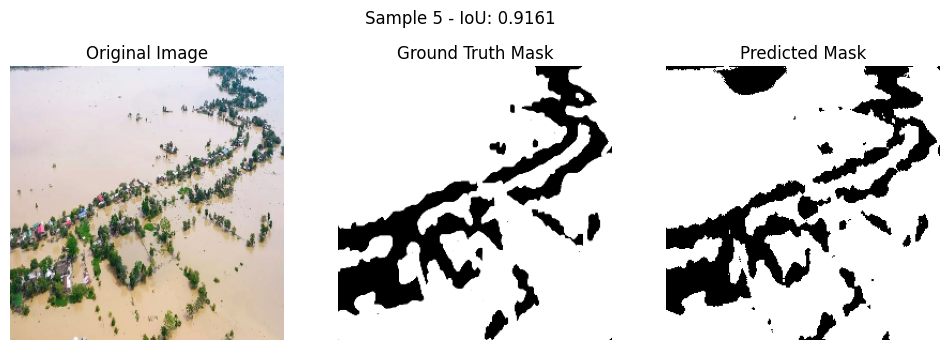

In [87]:
model.load_weights("flood_segmentation_model.keras")

for i in range(min(5, len(val_images))):
    original_img = read_image(val_images[i])
    ground_truth_mask = read_mask(val_masks[i])

    predicted_mask = model.predict(np.expand_dims(original_img, 
                                                  axis = 0))[0]
    predicted_mask_thresholded = (predicted_mask > 0.5).astype(np.uint8)

    iou_score = iou(ground_truth_mask, predicted_mask_thresholded)

    plt.figure(figsize = (12, 4))
    plt.suptitle(f"Sample {i+1} - IoU: {iou_score:.4f}", 
                 fontsize = 12)
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_img)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(ground_truth_mask, 
               cmap = "gray")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask_thresholded, 
               cmap = "gray")
    plt.axis("off")
    
    plt.savefig(f"prediction_sample_{i}.png")
    plt.show()

> Based on the final results after 64 epochs, it can be concluded that the model has achieved good convergence. From the IoU, Loss, and Accuracy over Epochs plots, there is no significant indication of overfitting, as the training and validation curves remain close and stable throughout the training process.
> With final values of:
> - **Training Loss**: 0.1971
> - **Validation Loss**: 0.2359
> - **Training Accuracy**: 0.9089
> - **Validation Accuracy**: 0.8945
> - **Training IoU**: 0.8161
> - **Validation IoU**: 0.7999
>
> The relatively small and consistent gap between training and validation metrics indicates that the model performs well on both seen and unseen data.
> Additionally, based on the visualization results, the predicted segmentations appear accurate and well-aligned with the ground truth masks, reinforcing the model's capability to generalize well to new data.
> This reflects the model’s overall robustness and suitability for the segmentation task.